# Analysis of the results

Music genre classification presents significant challenges, particularly when dealing with datasets that include both a primary genre and a set of additional genres for each track. In this scenario, the model is trained using only the top genre, which can lead to misclassifications due to overlapping attributes among genres. 

For instance, a track labeled primarily as 'hip-hop' might also be categorized under 'folk,' while another track labeled as 'electronic' could similarly include 'folk' elements. Despite having different primary genres, both tracks share folk characteristics, complicating the classification process. 

Furthermore, tracks with a common top genre can vary significantly depending on the other genres they encompass. A 'rock' track with 'blues' influences will sound markedly different from a 'rock' track with 'electronic' elements, yet both are simply labeled as 'rock.' This diversity within the same primary genre adds another layer of complexity, making it difficult for the model to accurately classify tracks. Such nuances highlight the multifaceted nature of music and the challenges in training models.

---

In [1]:
order = ['Instrumental', 'Hip-Hop', 'International', 'Folk', 'Experimental', 'Electronic', 'Rock', 'Pop']

This is the order of the classes where label 0 is instrumental and label 7 is pop genre music. 
In the confusion matrix, the some of the highest values (out of the diagonal; that is to say, missclassified instances) are in cells [5, 1], [0, 3], [7, 3] and [7, 2]. That would mean the model returns 
- [5, 1]: Hip-hop as the predicted genre when in reality it is an electronic track
- [0, 3]: Folk when in reality it's an instrumental track
- [7, 3]: Folk when in reality it's a pop track
- [7, 2]: International when in reality it's a pop track

This indicates possible overlaps in features between these genres that the model struggles to differentiate.

Let's study some of these genres which are missclassified. 

In [2]:
import pandas as pd

In [30]:
df = pd.read_csv("MY_DATA.csv")

# Retrieve the first 10 spectrograms that are of x genre
def get_spectrogram_from_genre(genre, num=16):
    llista = [] #list with spectrograms path
    i = 0
    for _, row in df.iterrows():
        if row['labels'] == genre:
            llista.append(row['image_paths'])
            i += 1
        if i == num:
            break
    return llista

In [31]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def plot_spectrograms(image_paths, genre):
    fig, axs = plt.subplots(4, 4, figsize=(15, 10))

    for i, ax in enumerate(axs.flat):
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.axis('off')

    plt.suptitle(genre, fontsize=16)
    plt.tight_layout()
    plt.show()

To analyze spectrograms effectively and understand the characteristics of different music genres, it’s crucial to understand how spectrograms represent audio signals and how to identify key features within them.
Y-axis (Vertical): Represents frequency. Lower frequencies (bass sounds) are at the bottom, and higher frequencies (treble sounds) are at the top.
Color Intensity: this represents the amplitude or loudness of the signal at a given frequency and time. Brighter colors indicate higher energy or louder sounds, while darker colors indicate lower energy.

## Beats and patterns:

High Beat: In a spectrogram, beats are typically seen as vertical lines or regular patterns along the time axis (X-axis). Strong beats, will appear as bright, regular vertical lines indicating bursts of energy across multiple frequencies.

Repetitive Patterns: Recurring structures along the time axis.

## Spectrogram analysis

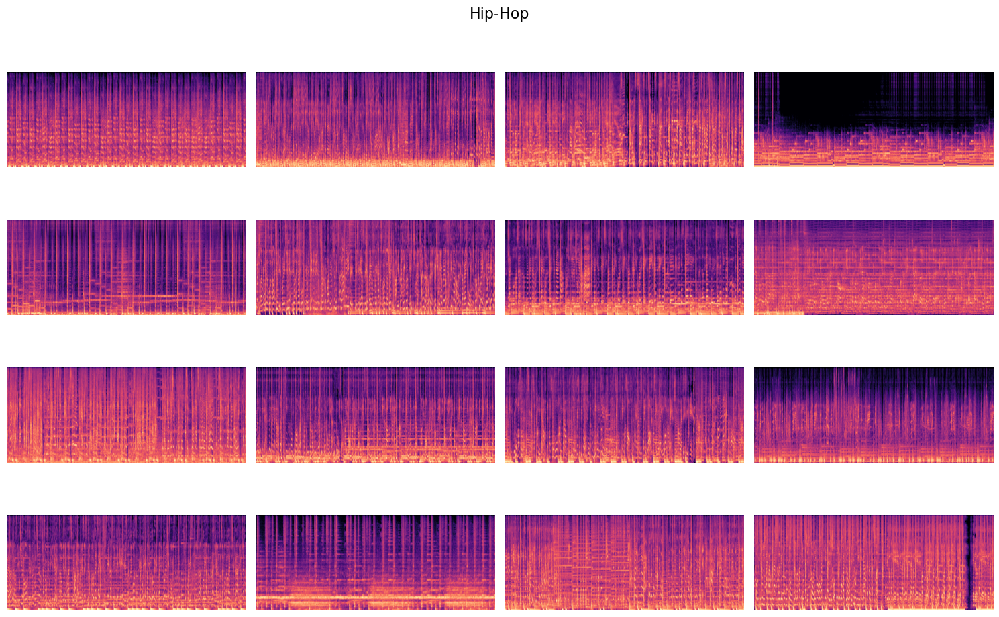

In [32]:
hiphop = get_spectrogram_from_genre('Hip-Hop')
plot_spectrograms(hiphop, 'Hip-Hop')

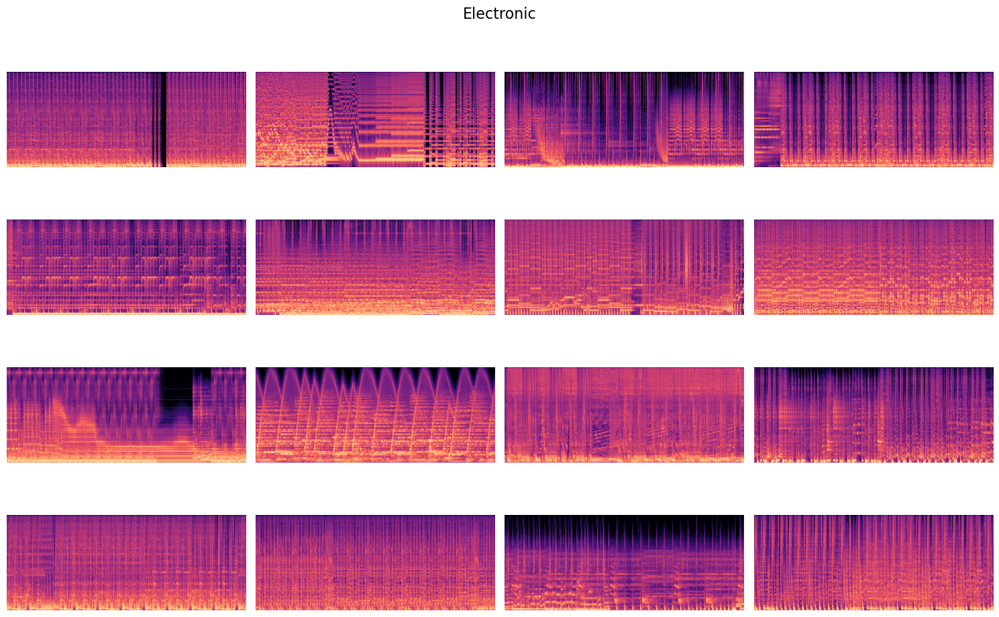

In [33]:
electronic = get_spectrogram_from_genre('Electronic')
plot_spectrograms(electronic, 'Electronic')

Just by looking at the spectrograms, both hip-hop and electronic seem to have a pretty homogeneous spectrogram. 

After investigating, electronic tracks typically show repetitive patterns, consistent beats, and may have high-energy regions, often seen as bright areas recurring at regular intervals. They also have less variation in structure due to synthesized beats.

While hip-hop tracks generally exhibit strong, repetitive beats (again, represented by bright vertical lines) and rhythmic elements with vocal presence. They also might have consistent energy at certain frequencies, particularly in the bass range.

We should check if strong beats and repetitive patterns in hip-hop spectrograms are mistaken for electronic music’s consistency.

As previously mentioned, both have strong beats and repetitive patterns shown as homogeneous patterns of the signal. 

We can also see that in one of the examples of hip-hop, there is a low signal throughout the whole time in the upper area. That indicates that this track didn't have high energy/loud sounds in the higher frequency part of the spectrogram. Hip hop is characterized by having bright regular lines (which represent bursts of energy), however, that one track didn't seem to have as many bursts of energy. That track could be one of the misclassified since it breaks characteristics from the Hip-hop genre tracks. 



---------------------------------------------------------------------------------

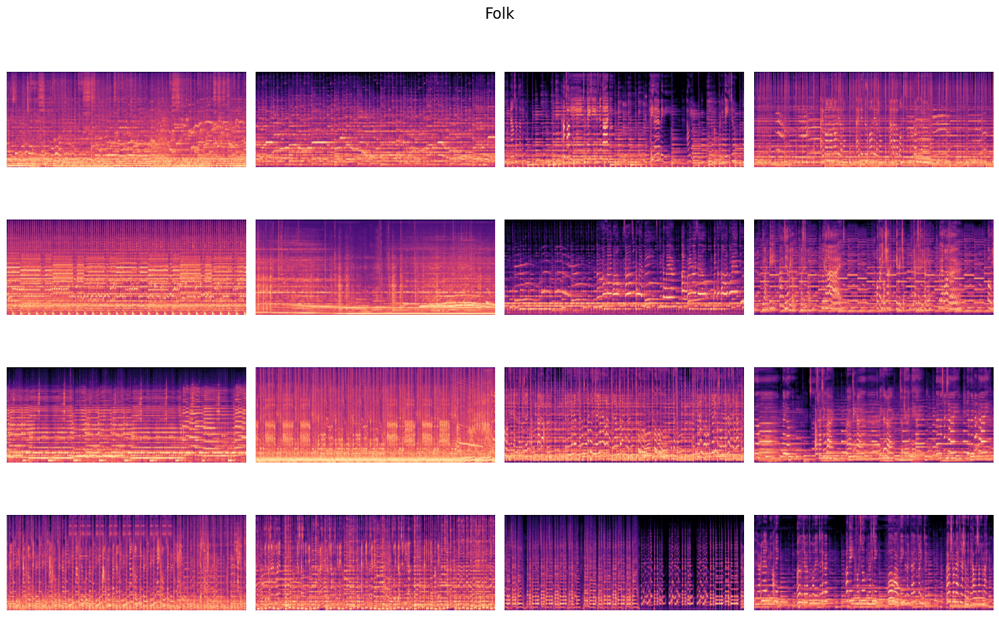

In [34]:
folk = get_spectrogram_from_genre('Folk')
plot_spectrograms(folk, 'Folk')

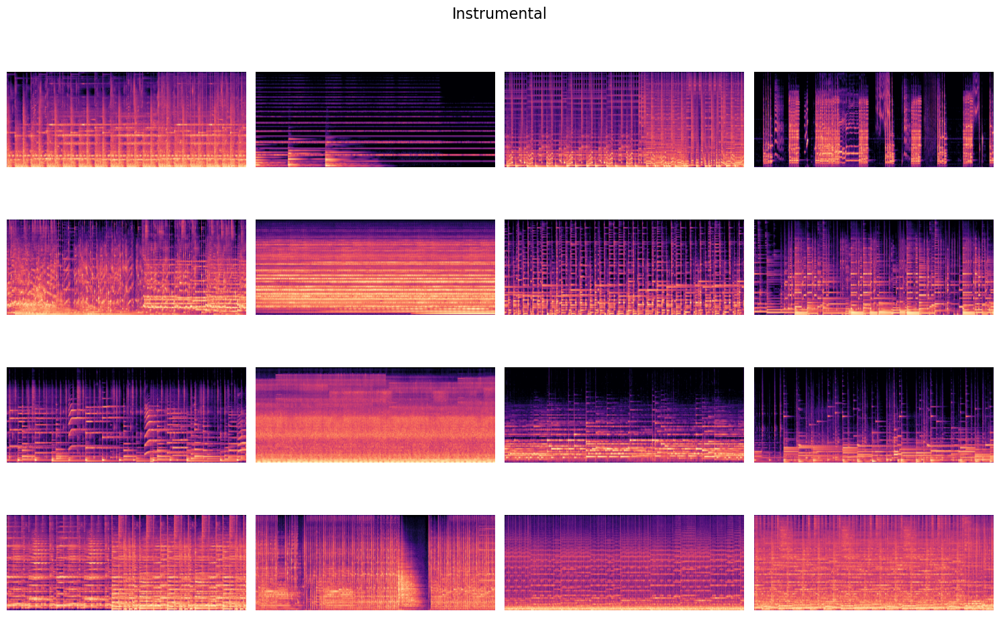

In [35]:
instrumental = get_spectrogram_from_genre('Instrumental')
plot_spectrograms(instrumental, 'Instrumental')

Folk tracks might show a mixture of acoustic patterns, less electronic inference and more natural sound variations. 
Instrumental tracks often have a wide dynamic range and clear separation between different instruments with potentially less regular rhythmic patterns. 
Both instrumental and folk music often use acoustic instruments, such as guitars, violins, and flutes, leading to similar timbral qualities and harmonic structures in the spectrograms.

The frequency content of instrumental and folk music can overlap significantly, especially in the mid and high ranges where string and wind instruments commonly play.

Folk music might have rhythmic patterns that resemble those found in instrumental pieces, especially if the instrumental music includes traditional or classical pieces with regular rhythmic structures.

Folk music’s acoustic patterns might resemble instrumental tracks if there’s a lack of vocal presence.

Instrumental music tracks seem to have a separation between instruments (remember that those sounds that have higher frequency will appear on top of the spectrogram while those with lower frequency will appear below) as shown in the spectrograms where we can separate horizontal areas that differ in pattern as well as loudness in the signal. 
This can be confused with folk tracks if there isn't a vocal presence which is likely because to create these spectrograms we got the first part of the song. 
Frequently, the singer doesn't start singing until later on. 
The model might have picked up these previously mentioned characteristics that most possibly might have overlapped. 

_________________________

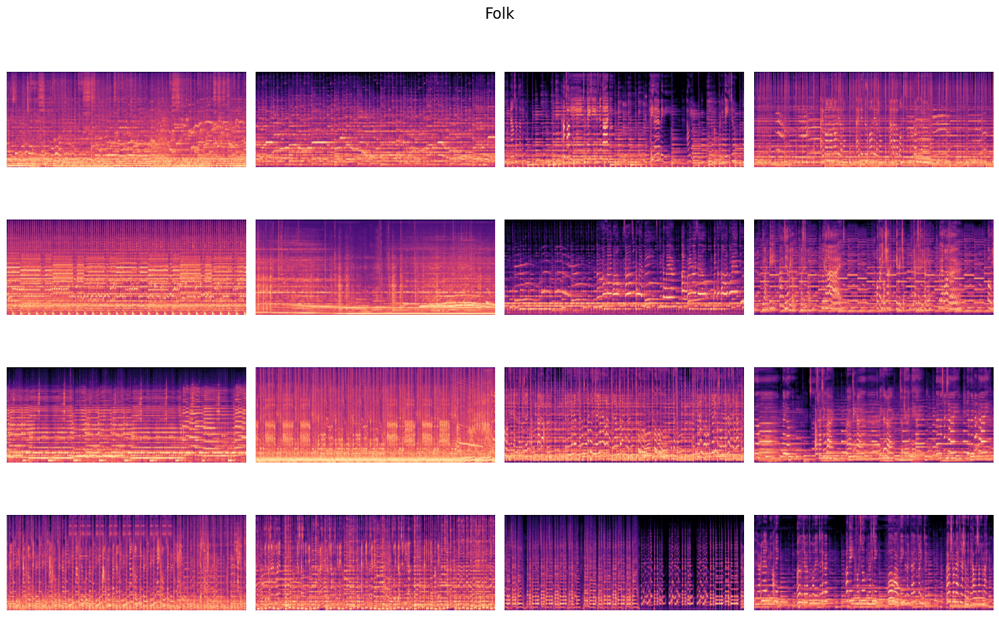

In [36]:
plot_spectrograms(folk, 'Folk')

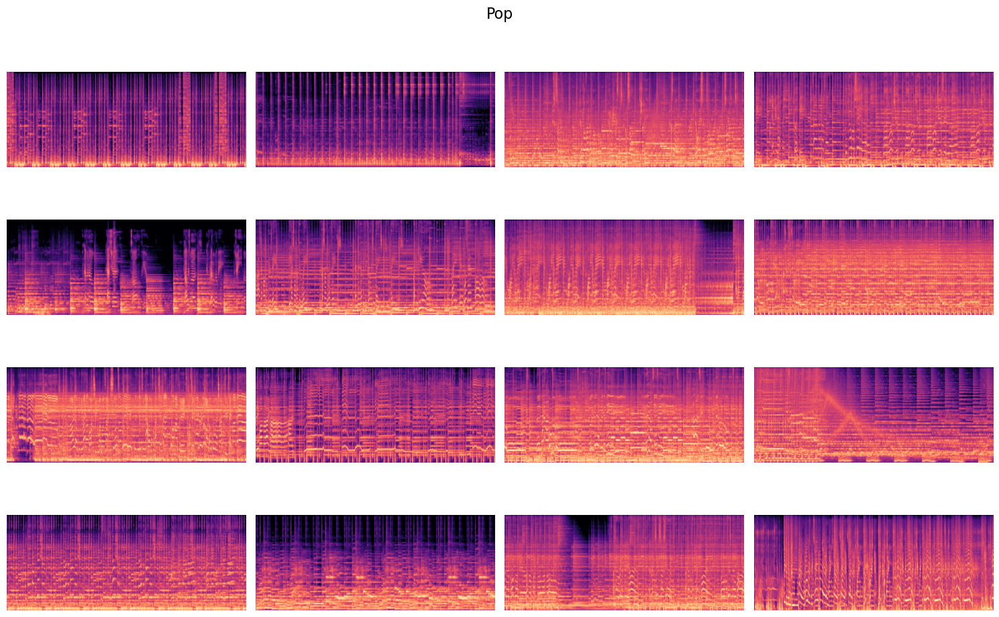

In [37]:
pop = get_spectrogram_from_genre('Pop')
plot_spectrograms(pop, 'Pop')

Folk tracks might show a mix of acoustic patterns, less electronic interference, and more natural sound variations.
Pop tracks often have a mixture of electronic and acoustic elements, with a prominent regular beat and melodic elements.

Pop music’s varied elements might overlap with the acoustic nature of folk

Both pop tracks and folk tracks have variations in intensity and frequency due to different instruments often acoustic, which makes the sound natural. Even if pop usually has more prominent, regular beats, it could be that a track follows a less structured rhythm and is confused by the model with a folk track.

---------------------

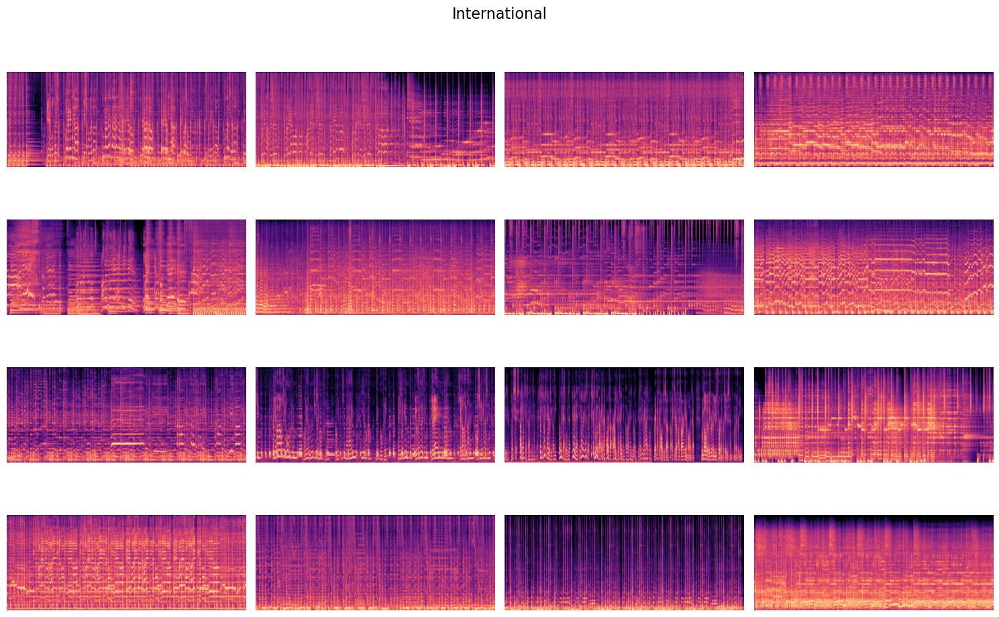

In [38]:
international = get_spectrogram_from_genre('International')
plot_spectrograms(international, 'International')

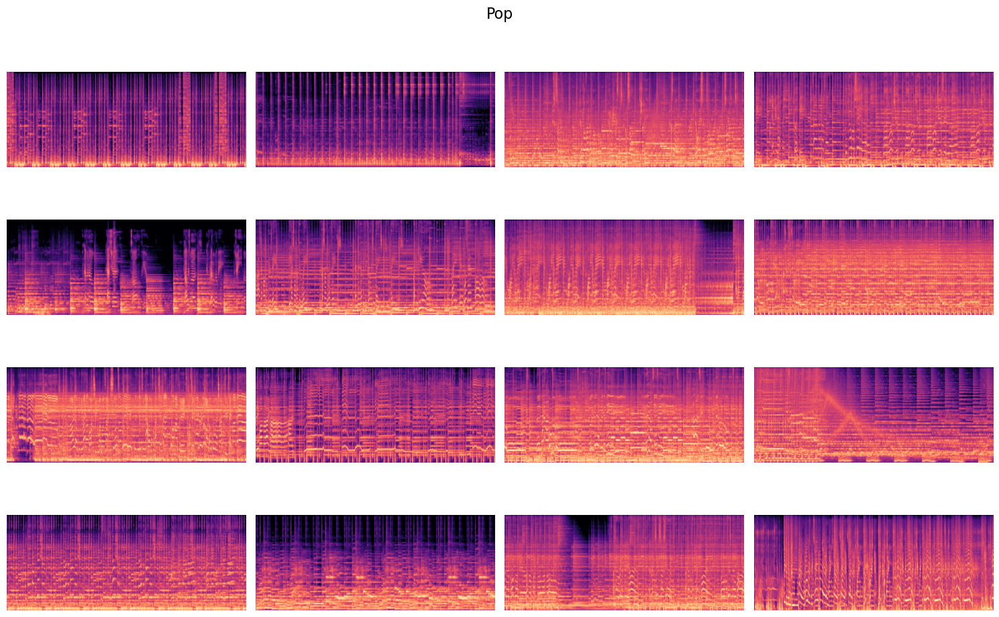

In [39]:
plot_spectrograms(pop, 'Pop')

International tracks vary widely but often include traditional instruments and distinct rhythmic patterns unique to specific cultures.

Pop music’s varied elements might overlap with the acoustic nature of international music.

Modern pop frequently incorporates global musical influences, making it sound similar to international music.
International music may also use a variety of instruments, some of which could be similar to those used in pop music. For example, international music from various regions can include modern electronic elements or popular instruments like guitars and keyboards.

While pop music generally has a regular catchy beat, international music can have diverse rhythmic structures. However, many international genres incorporate regular and catchy beats, especially if they are influenced by or integrated into popular music styles.

Spectrograms of pop music usually show a consistent and strong presence across a wide range of frequencies, with noticeable energy in both the lower (bass) and higher (treble) ranges. Vocal lines often create prominent, melodic patterns.
Depending on the region, international music can also show strong frequency patterns across a wide range.

-----------------------------------

## Takeout from the analysis

While the reasons explained after the 4 most common misclassifications of our model do make sense can could be the reason behind our model's mistakes, it is important to note that the spectrograms are generated after a short period from the track. It would be worth to further analysing what part of the spectrogram the model is focusing on to provide an exhaustive study of the results. 
In addition, a possible approach to enhance the model's performance would be to get different and varied parts of each track thus allowing the model to learn and generalize better.  